In [1]:
%pylab inline
plt.style.use('dark_background')
pylab.rcParams['figure.figsize'] = (10.0, 6.0)

Populating the interactive namespace from numpy and matplotlib


# Trajectory functions (from given code)

In [2]:
def point_to_point_traj(x1, x2, v1, v2, delta_t):
  t = np.linspace(0, delta_t, 100)  
  a0 = x1
  a1 = v1
  a2 = (3*x2 - 3*x1 - 2*v1*delta_t - v2 * delta_t) / (delta_t**2)
  a3 = (2*x1 + (v1 + v2) * delta_t  - 2 * x2) / (delta_t**3)
  
  polynomial = a0 + a1 * t + a2 * t**2 + a3 * t**3

  print(str(a0) + " + " + str(a1) + "t + " + str(a2) + "t^2 + " + str(a3) + "t^3") # print coefficients to bring to CoppeliaSim

  derivative = a1 + 2*a2 * t + 3 * a3 * t**2
  return polynomial, derivative


def piecewise2D (X,Y, Vx, Vy, T):
    theta_x, theta_y, dx, dy = [], [], [], []

    for i in range(len(P)-1):          
        theta_xi, dxi = point_to_point_traj(X[i], X[i+1], Vx[i], Vx[i+1], T[i+1] - T[i])
        theta_yi, dyi = point_to_point_traj(Y[i], Y[i+1], Vy[i], Vy[i+1], T[i+1] - T[i])

        theta_x += theta_xi.tolist()
        theta_y += theta_yi.tolist()
        dx += dxi.tolist()
        dy += dyi.tolist()

        plot(theta_xi, theta_yi)
    return theta_x, theta_y, dx, dy

# Plotting functions

In [110]:
# Plotting
def plot_points():
    plot(X,Y, '--')
    plot(X,Y, 'o')
    quiver(X,Y, Vx, Vy, color='r')
    
# Speed
def plot_speed():
    speed = np.sqrt(np.array(dx)**2 + np.array(dy)**2)
    plot(speed)

# Drawing the trajectory for the Omnibot

In [300]:
##### Requirements for the trajectory

# Waypoints
p0 = [7.625,8.550]
p1 = [0.400,8.050]
w1 = [4, 7.5]
p2 = [1.925,2.225]
p5 = [-3.675,3.400]
w6 = [-3.675,7]
w3 = [0,0]
p3 = [4.800,-2.500]
w5 = [9.5, -4.05]
p4 = [6.125,-6.150]
w7 = [0.5,-7]
w2 = [-1, -3]
w4 = [-3.2,-8.5]
p6 = [-6.650,-8.500]

# Velocities
v0 = [-0.025, 0]
v1 = [0.5,0.01]
v_w1 = [-0.25, -0.25]
v2 = [-1,0]
v3 = [-0.001,2]
v_w6 = [0.1, -0.1]
v_w3 = [0.15,-0.65]
v4 = [0.65, -0.1]
v_w5 = [-0.25, -0.75]
v5 = [-1.55, -0.5]
v_w7 = [0,0.5]
v_w2 = [-0.7, -0.7]
v_w4 = [-0.01,0]
v6= [0,0]

# Time
t0 = 0
t1 = t0 + 10
t_w1 = t1 + 10
t2 = t_w1 + 10
t3 = t2 + 10
t_w6 = t3 + 10
t_w3 = t_w6 + 10
t4 = t_w3 + 10
t_w5 = t4 + 10
t5 = t_w5 + 10
t_w7 = t5 + 10
t_w2 = t_w7 + 10
t_w4 = t_w2 + 10
t6 = t_w4 + 10

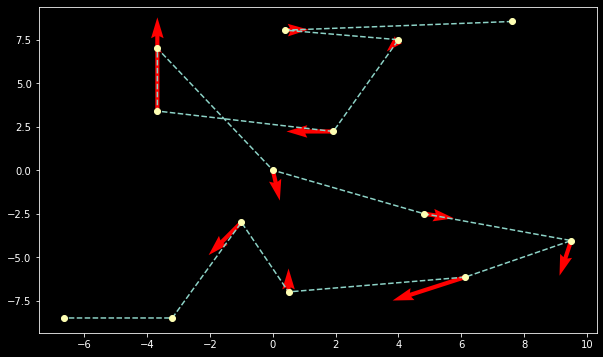

In [301]:
# Convert the initial conditions to a vector form
P = np.vstack((p0, p1, w1, p2, p5, w6, w3, p3, w5, p4, w7, w2, w4, p6))
V = np.vstack((v0, v1, v_w1, v2, v3, v_w6, v_w3, v4, v_w5, v5, v_w7, v_w2, v_w4, v6))
T = [t0, t1, t_w1, t2, t3, t_w6, t_w3, t4, t_w5, t5, t_w7, t_w2, t_w4, t6]

X, Y = P[:,0], P[:,1]
Vx, Vy = V[:,0], V[:,1]

plot_points()

7.625 + -0.025t + -0.26175t^2 + 0.0192t^3
8.55 + 0.0t + -0.016t^2 + 0.0011000000000000014t^3
0.4 + 0.5t + 0.03300000000000001t^2 + -0.0047t^3
8.05 + 0.01t + 0.006499999999999979t^2 + -0.0012999999999999989t^3
4.0 + -0.25t + 0.08775000000000001t^2 + -0.00835t^3
7.5 + -0.25t + -0.10825t^2 + 0.00805t^3
1.925 + -1.0t + 0.032100000000000024t^2 + 0.0011900000000000014t^3
2.225 + 0.0t + -0.16475t^2 + 0.01765t^3
-3.675 + -0.001t + -0.0098t^2 + 0.0009900000000000002t^3
3.4 + 2.0t + -0.282t^2 + 0.011800000000000001t^3
-3.675 + 0.1t + 0.07524999999999998t^2 + -0.004849999999999999t^3
7.0 + -0.1t + -0.125t^2 + 0.0065t^3
0.0 + 0.15t + 0.04899999999999999t^2 + -0.0015999999999999996t^3
0.0 + -0.65t + 0.065t^2 + -0.0025t^3
4.8 + 0.65t + 0.03600000000000001t^2 + -0.0054t^3
-2.5 + -0.1t + 0.048500000000000015t^2 + -0.0054t^3
9.5 + -0.25t + 0.10375t^2 + -0.01125t^3
-4.05 + -0.75t + 0.13699999999999996t^2 + -0.0083t^3
6.125 + -1.55t + 0.14125t^2 + -0.00425t^3
-6.15 + -0.5t + 0.02450000000000003t^2 + 0.00

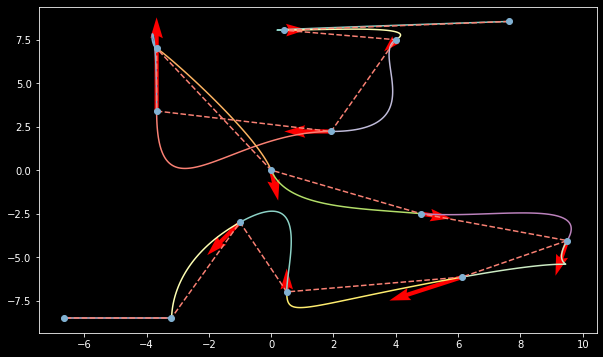

In [302]:
# Plot the trajectory that passes trhough the desired waypoints
theta_x, theta_y, dx, dy = piecewise2D(X,Y, Vx, Vy, T)
plot_points()

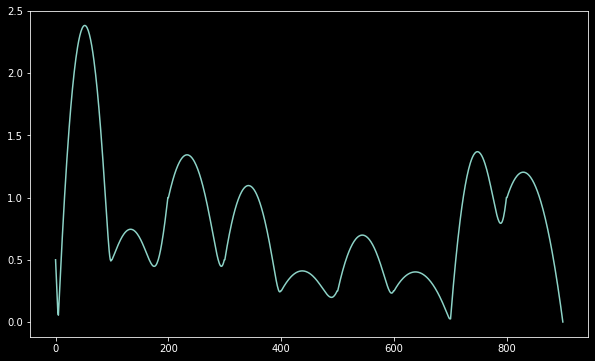

In [47]:
# Plot speed
plot_speed()

# Example 2

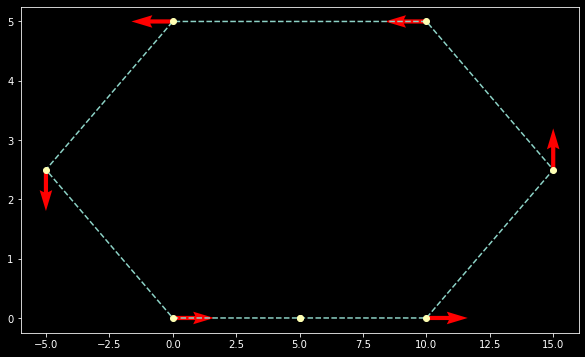

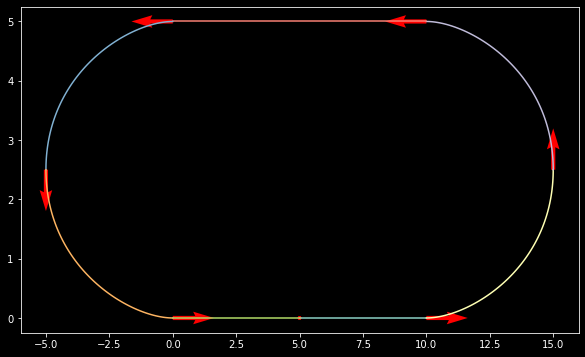

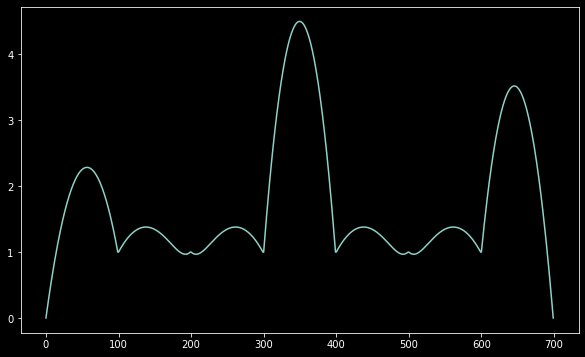

In [8]:
##### Requirements for the trajectory

# Waypoints
p1 = [5.,0]
p2 = [10, 0]
p3 = [15,2.5]
p4 = [10,5]
p5 = [0,5]
p6 = [-5,2.5]
p7 = [0,0]
p8 = [5,0]

# Velocities
v1 = [0.0001,0.]
v2 = [1,0]
v3 = [0,1]
v4 = [-1,0]
v5 = [-1,0]
v6 = [0,-1]
v7 = [1,0]
v8 = [0.0001,0]

# Time
t1 = 0
t2 = t1 + 3
t3 = t2 + 5
t4 = t3 + 5
t5 = t4 + 3
t6 = t5 + 5
t7 = t6 + 5
t8 = t7 + 2


# Grouping
P = np.vstack((p1, p2, p3, p4, p5, p6, p7, p8))
V = np.vstack((v1, v2, v3, v4, v5, v6, v7, v8))
T = [t1, t2, t3, t4, t5, t6, t7, t8]

X, Y = P[:,0], P[:,1]
Vx, Vy = V[:,0], V[:,1]

# Plotting
plot_points()
show()

# Piecewise function
theta_x, theta_y, dx, dy = piecewise2D(X,Y, Vx, Vy, T)

# Plotting
quiver(X,Y, Vx, Vy, color='r')  #

show()
plot_speed()

# Moving the point in time
Be sure that you have JSAnimation installed. If not pip install JSAnimation

C:\Users\juicer\anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in double_scalars
C:\Users\juicer\anaconda3\lib\site-packages\ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in double_scalars


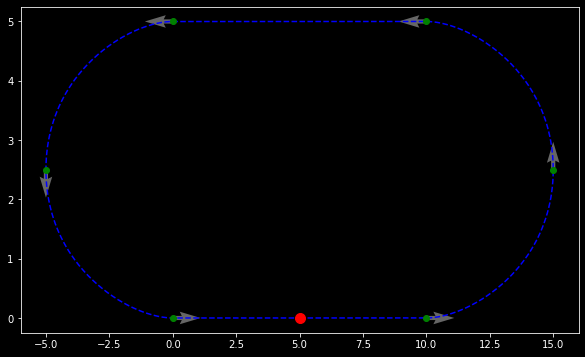

In [9]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    ax.plot(theta_x, theta_y, 'b--')
    
    # Initial conditions
    ax.plot(X,Y, 'go')
    ax.quiver(X,Y, Vx, Vy, color='0.4', scale=20)
        
    # Dynamic position
    ax.plot(theta_x[t], theta_y[t], 'ro', markersize=10)
       
    # Velocity vector
    ax.quiver([theta_x[t]], [theta_y[t]], [dx[t]], [dy[t]], color='r', units='xy', scale=10/np.linalg.norm([theta_x[t], theta_y[t]]))
    

anim = animation.FuncAnimation(fig, animate, frames=int(len(theta_x)/1), interval=25)


HTML(anim.to_jshtml())

In [10]:
# Export the movie to mp4
Be sure that you have the ffmpeg codec installed (sudo apt-get install ffmpeg).

SyntaxError: invalid syntax (<ipython-input-10-a9a38e48c230>, line 2)

In [ ]:
anim.save('trajectory2.mp4', dpi=300)